# Mask RCNN Inference and Segmentation

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import os
import warnings

# Ignore the annoying warnings that come up, there are many of them.
warnings.filterwarnings("ignore")

# Set environment variable CUDA_VISIBLE_DEVICES to "-1" to prevent
# tensorflow from using any GPUs
os.environ["CUDA_VISIBLE_DEVICES"] = "-1"

In [2]:
import io
import os
import sys
import random
import math
import re
import time
import json
from collections import defaultdict

import numpy as np
import matplotlib
import matplotlib.pyplot as plt

import skimage
from skimage.io import imread, imsave
from skimage.transform import resize

import cv2

# Root directory of the project
ROOT_DIR = os.path.abspath("../../")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
from mrcnn.model import log

# Custom logging libaries
from ds_toolbox.ds_logging import add_log_file, set_log_level
from ds_toolbox.ds_logging import info, debug, warn, error
set_log_level("debug")

# Import ade20k_coco library
import ade20k_coco
from ade20k_coco import Ade20kCocoConfig, Ade20kCocoDataset

# Ignore Tensorflow Deprecation Warnings
from tensorflow.python.util import deprecation
deprecation._PRINT_DEPRECATION_WARNINGS = False

# Ignore additional warnings
import tensorflow as tf
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)


# Set SEED for numpy
SEED = 10
np.random.seed(SEED)

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")
# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")

# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

Using TensorFlow backend.


# HED Model
Load the model. If `hed_pretrained_bsds.caffemodel` is not found, run the following in the same directory as this notebook:
```
wget http://vcl.ucsd.edu/hed/hed_pretrained_bsds.caffemodel
```

In [3]:
prototxt = "deploy.prototxt"
caffemodel = "hed_pretrained_bsds.caffemodel"
target_w = target_h = 500

class CropLayer(object):
    def __init__(self, params, blobs):
        self.xstart = 0
        self.xend = 0
        self.ystart = 0
        self.yend = 0

    # Our layer receives two inputs. We need to crop the first input blob
    # to match a shape of the second one (keeping batch size and number of channels)
    def getMemoryShapes(self, inputs):
        inputShape, targetShape = inputs[0], inputs[1]
        batchSize, numChannels = inputShape[0], inputShape[1]
        height, width = targetShape[2], targetShape[3]

        self.ystart = (inputShape[2] - targetShape[2]) // 2
        self.xstart = (inputShape[3] - targetShape[3]) // 2
        self.yend = self.ystart + height
        self.xend = self.xstart + width

        return [[batchSize, numChannels, height, width]]

    def forward(self, inputs):
        return [inputs[0][:,:,self.ystart:self.yend,self.xstart:self.xend]]

cv2.dnn_registerLayer('Crop', CropLayer)
# Load the model.
net = cv2.dnn.readNet(prototxt, caffemodel)

In [4]:
# TODO: enter relative path to dataset
DATASET_ROOT = os.path.join(ROOT_DIR, "datasets/ade20k_coco_v4") 

dataset_train = ade20k_coco.Ade20kCocoDataset()
dataset_train.load_coco(DATASET_ROOT, "train")

dataset_val = ade20k_coco.Ade20kCocoDataset()
dataset_val.load_coco(DATASET_ROOT, "val")

# Must call before using the dataset
dataset_train.prepare()
dataset_val.prepare()

n_classes = dataset_train.num_classes

print(f"Image Count (train/val): {len(dataset_train.image_ids)}/{len(dataset_val.image_ids)}")
print("Class Count: {}".format(n_classes))

labelmap = {i['id']: i['name'] for i in dataset_train.class_info}
print(f"Labelmap: {labelmap}")

# Ensure this is correct.
WALL_ID = 3
WALL_LABEL = labelmap[WALL_ID]
print(f"{WALL_ID} ==> {WALL_LABEL}")
assert "wall" in WALL_LABEL

loading annotations into memory...
Done (t=0.55s)
creating index...
index created!
loading annotations into memory...
Done (t=0.04s)
creating index...
index created!
Image Count (train/val): 4987/500
Class Count: 5
Labelmap: {0: 'BG', 1: 'ceiling', 2: 'floor, flooring', 3: 'wall', 4: 'windowpane, window'}
3 ==> wall


In [5]:
%%time

class InferenceConfig(Ade20kCocoConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

inference_config = InferenceConfig()

# Recreate the model in inference mode
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

model_path = model.find_last()
model.load_weights(model_path, by_name=True)

Re-starting from epoch 9
CPU times: user 9.99 s, sys: 711 ms, total: 10.7 s
Wall time: 9.41 s


In [6]:
def use_model(file_id=None):
    if file_id is None:
        file_id = np.random.choice(dataset_val.image_ids)
    
    fname = f"/home/mxs8x15/datasets/coco_ade20k_v4/val2014/{file_id}.jpg"
    debug(f"Using image val2014/{file_id}.jpg")
    
    real_img = imread(fname)
    molded_images, image_metas, windows = model.mold_inputs([real_img])
    km = model.keras_model
    image_shape = (image_metas.astype(int).squeeze())[4:7]
    
    anchors = model.get_anchors(image_shape)
    anchors = np.broadcast_to(anchors, (model.config.BATCH_SIZE,) + anchors.shape)
    
    # Run model through keras model.
    detections, _, _, mrcnn_mask, _, _, _ = km.predict([molded_images,
                                                        image_metas, 
                                                        anchors], verbose=0)
    
    i = 0
    detections = detections[i]
    mrcnn_mask = mrcnn_mask[i]

    # How many detections do we have?
    # Detections array is padded with zeros. Find the first class_id == 0.
    zero_ix = np.where(detections[:, 4] == 0)[0]
    N = zero_ix[0] if zero_ix.shape[0] > 0 else detections.shape[0]
    debug(f"There are {N} detections for image {file_id}.jpg")

    # Extract boxes, class_ids, scores, and class-specific masks
    boxes = detections[:N, :4]
    class_ids = detections[:N, 4].astype(np.int32)
    scores = detections[:N, 5]
    masks = mrcnn_mask[np.arange(N), :, :, class_ids]
    
    image_metas = image_metas.astype(int).squeeze()
    image_shape = image_metas[4:7]
    (start_row, start_col, end_row, end_col) = image_metas[7:11]

    # Convert boxes to pixel coordinates on the original image
    denormed_boxes = utils.denorm_boxes(boxes, image_shape[:2])
    instance_masks = []

    for i in range(N):
        bbox = denormed_boxes[i]
        mask = masks[i]
        y1, x1, y2, x2 = bbox
        detected_mask = utils.resize(mask, (y2 - y1, x2 - x1))
        
        # Put the mask in the right location.
        full_mask = np.zeros(image_shape[:2])
        full_mask[y1:y2, x1:x2] = detected_mask
        instance_masks.append(full_mask)

    stacked_instance_masks = np.array(instance_masks)
    h, w, _ = image_shape
    raw_confidence_masks = np.zeros((n_classes, h, w))

    # Uniform 30% chance of being label 0: BG
    raw_confidence_masks[0] = np.ones((h, w)) * 0.30

    for idx in range(N):
        conf_mask = instance_masks[idx]
        label = class_ids[idx]
        raw_confidence_masks[label] = np.maximum(raw_confidence_masks[label], conf_mask)
        
    # Tranpose the conf mask so it becomes (h, w, n_classes)
    raw_confidence_masks = np.transpose(raw_confidence_masks, axes=[1, 2, 0])

    # Crop down to the dimensions of the molded image pre-padding.
    cropped_masks = raw_confidence_masks[start_row:end_row, start_col:end_col, :]
    
    # Resize the mask to the size of the image
    resized_masks = skimage.transform.resize(cropped_masks, real_img.shape[:2])
    
    pred_mask = np.argmax(resized_masks, axis=-1)
    conf_mask = np.max(resized_masks, axis=-1)
    
#     scaled_img = skimage.transform.resize(cropped_masks, pred_mask.shape[:2])

    return (real_img, pred_mask, conf_mask)

04/27/2020 03:01:17 PM [DEBUG] Using image val2014/117.jpg
04/27/2020 03:01:23 PM [DEBUG] There are 6 detections for image 117.jpg


(1720, 2580, 3) (1720, 2580) (1720, 2580)


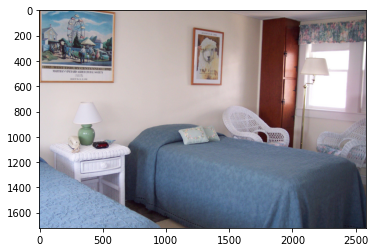

In [7]:
(real_img, pred_mask, conf_mask) = use_model(117)
print(real_img.shape, pred_mask.shape, conf_mask.shape)
plt.imshow(real_img)

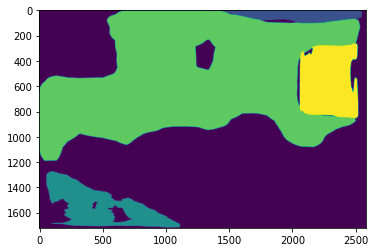

In [8]:
plt.imshow(pred_mask)

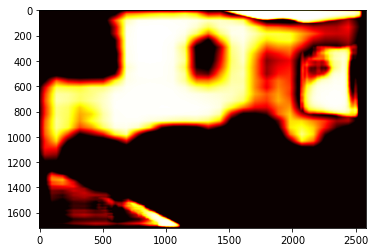

In [9]:
plt.imshow(conf_mask, cmap="hot")

In [10]:
labelmap

{0: 'BG',
 1: 'ceiling',
 2: 'floor, flooring',
 3: 'wall',
 4: 'windowpane, window'}

In [11]:
def create_hed(img):
    inp = cv2.dnn.blobFromImage(img, scalefactor=1.0, size=(target_w, target_h),
                           mean=(104.00698793, 116.66876762, 122.67891434),
                           swapRB=False, crop=False)
    net.setInput(inp)
    hed_edges = net.forward()
    hed_edges = hed_edges[0, 0]
    hed_edges = cv2.resize(hed_edges, (img.shape[1], img.shape[0]))
    hed_edges = 255 * hed_edges
    hed_edges = hed_edges.astype(np.uint8)
    hed_edges = cv2.cvtColor(hed_edges, cv2.COLOR_GRAY2BGR)
    return hed_edges

In [12]:
def highest_weight_label(region_mask, labels, pred_mask, conf_mask,
                        operation="mean"):
    
    region_mask = region_mask[1:-1, 1:-1]
    mask_r, mask_c = np.where(region_mask)

    region_labels = pred_mask[mask_r, mask_c]
    region_confs = conf_mask[mask_r, mask_c]
    
    # Maps labels to the mean confidence for that label.
    weights = {}
    for label in labels:
        idx_mask = (region_labels == label)
        # Take the mean of the confidence values for that label.
        if operation == "median":
            weight = np.median(region_confs[idx_mask])
        else:
            weight = np.mean(region_confs[idx_mask])
        weights[label] = weight
        
    # Find most probable label according to weight
    best_label, highest_weight = max(weights.items(), key=lambda x: x[1])
    return best_label

In [82]:
data = np.array([3, 6, 45, 55, 100, 120])
x = data <= 100
y = data > 10
x, y, (x&y)

(array([ True,  True,  True,  True,  True, False]),
 array([False, False,  True,  True,  True,  True]),
 array([False, False,  True,  True,  True, False]))

In [83]:
z = data > 200

In [100]:
def create_filled(img, raw_seg, conf_mask, threshold=0.60,
                 edges_thresh=None):
    
    h, w = conf_mask.shape

    labels = np.unique(raw_seg).tolist()
    labels = [li for li in labels if li != 0] + [0]
    
    if edges_thresh is None:    
        hed_edges = create_hed(img)
        _, edges_thresh = cv2.threshold(hed_edges, 70, 255, cv2.THRESH_BINARY_INV)
        h, w, _ = edges_thresh.shape
        edges_thresh = edges_thresh[:, :, 0]    
    
    im_floodfill = edges_thresh.copy()
    debug(f"im_floodfill: {im_floodfill.shape}")
#     plt.imshow(im_floodfill)
    
#     debug("img {} im_floodfill {} raw_seg {}".format(img.shape, im_floodfill.shape,
#                                                       raw_seg.shape))
    
#     raw_seg = skimage.transform.resize(raw_seg, im_floodfill.shape[:2])
#     conf_mask = skimage.transform.resize(conf_mask, im_floodfill.shape[:2])
    
    allowed_labels = set(labels)
    # Remove the background label for now.
    allowed_labels.remove(0)
    
    done = False
    while not done:
        if not allowed_labels:
            done = True
            break

        for label in labels:
            if label not in allowed_labels:
                continue

            textlabel = labelmap[label]

            # Find pixels where the predicted label is the label of interest and
            # no labels exists there already.
            matching_label = (raw_seg == label)
            unfilled = (im_floodfill == 255)
            
#             debug(f"matching_label: {np.sum(matching_label)}\t unfilled: {np.sum(unfilled)}")
            label_mask_r, label_mask_c = np.where((matching_label & unfilled))
            
            if len(label_mask_r) == 0:
                print(f"No locations for label {label, textlabel}")
                allowed_labels.remove(label)
                continue
            
            # Find corresponding confidence values for those locations
            conf_vals = conf_mask[label_mask_r, label_mask_c]
            # Iterate over the most confident pixels.
            idx_ordering = np.argsort(conf_vals)[::-1]
            
            if conf_vals[idx_ordering[0]] < threshold:
                print(f"No more confident locations for label {label, textlabel}")
                allowed_labels.remove(label)
                continue

#             plt.imshow(im_floodfill)        
            r = label_mask_r[idx_ordering[0]]
            c = label_mask_c[idx_ordering[0]]

#             r = c = None
#             for conf_idx in idx_ordering:
#                 confidence = conf_vals[conf_idx]
#                 if confidence <= threshold:
#                     # No more confident pixels for this label, remove
#                     # from allowed labels.
#                     print(f"No more confident locations for label {label, textlabel}")
#                     allowed_labels.remove(label)
#                     break

#                 r = label_mask_r[conf_idx]
#                 c = label_mask_c[conf_idx]
#                 pixel = im_floodfill[r, c]

#                 if np.all(pixel == 255):
#                     # We found an uncolored region
#                     break
#                 else:
#                     r = c = None
#                     continue

#             # Sanity check
#             if r is None:
#                 continue

                # Coordinate must be (x, y) rather than (row, col)
            x = c
            y = r
            coord = (x, y)
            
            mask = np.zeros((h+2, w+2), np.uint8)
            color = label
            cv2.floodFill(im_floodfill, mask, coord, color)

            # Sanity check: take this mask, get the most common label within it
            try:
                mode_label = highest_weight_label(mask, labels, raw_seg, conf_mask,
                                                 operation="median")
            except:
                mode_label = -1
            
            if mode_label != -1:
                color = mode_label + 1
                im_floodfill[mask] = color

    global keep_im_floodfill
    keep_im_floodfill = im_floodfill.copy()
    # Final post-processing step: Ensure the mask is range [0, NUM_CLASSES]
    msk = im_floodfill == 255
    im_floodfill[msk] = 0
    im_floodfill = np.clip(im_floodfill, 0, 255)
    refined_seg = im_floodfill.astype(np.uint8)

    return (edges_thresh, refined_seg)

In [101]:
def process_sample(img, raw_seg, conf_mask, threshold=0.60, edges_thresh=None):
    edges_thresh, refined_seg = create_filled(img, raw_seg, conf_mask,
                                              threshold=threshold,
                                              edges_thresh=edges_thresh)

    return (img, edges_thresh, refined_seg)


def disp_results(file_id, img, edges_thresh, refined_seg):
    plt.figure(dpi=300)
    plt.suptitle(f"Sample number {file_id}")
    plt.subplot(2, 2, 1)
    plt.imshow(img)
    
    plt.subplot(2, 2, 2)
    plt.imshow(edges_thresh)
    
    plt.subplot(2, 2, 3)
    plt.imshow(refined_seg)
    
    plt.subplot(2, 2, 4)
    
    present_classes = np.unique(refined_seg)
    n_present_classes = len(present_classes)

    h = 400
    w = h * n_present_classes
    legend = np.zeros((h, w), np.uint8)
    words = []
    title = ""
    for idx, val in enumerate(present_classes):
        legend[:, h*idx: h*(idx+1)] = val
        label = labelmap[val]
        # Keep final word in multi-word label
        last_word = label.split(",")[-1]
        words.append(last_word)

    plt.axis("off")
    plt.title(' | '.join(words))
    plt.imshow(legend)

In [102]:
def recolor_naive(img, refined_seg, color_uint8):
    plt.figure()
    color_showcase = np.ones((200, 200, 3), np.uint8) * color_uint8
    plt.title("Recolor Color")
    plt.imshow(color_showcase)
    
    # Naive Recoloring
    (h, w, c) = img.shape
    scaled_mask = skimage.transform.resize(refined_seg, (h, w), 
                                           mode='symmetric',
                                           preserve_range=True).astype(np.uint8)
    
    wall_mask = (scaled_mask == WALL_ID)
    
    w = 0.35
    naive_recolor = img.copy()
    naive_recolor[wall_mask, :] = (w * color_uint8) + ((1 - w) * img[wall_mask, :])
    naive_recolor = np.clip(naive_recolor, 0, 255)
    
    plt.figure(dpi=100)
    plt.title("Naive Recolor")
    plt.imshow(naive_recolor)
    return naive_recolor
    
def recolor_using_hsv(img, refined_seg, color_uint8, alpha=0.4, beta=0.15):
    
#     img = img.astype(np.float64) / 255.0
#     color_float = color_uint8.astype(np.float64) / 255.0
    color_float = color_uint8

    
    (h, w, c) = img.shape
    scaled_refined_seg = skimage.transform.resize(refined_seg, (h, w), 
                                                mode='symmetric',
                                                preserve_range=True).astype(np.uint8)
    
    wall_mask = (scaled_refined_seg == WALL_ID)

    # HSV Recoloring
    hsv_img = skimage.color.rgb2hsv(img)
#     plt.figure(dpi=120)
#     plt.title(f"HSV Img")
#     plt.imshow(hsv_img)
    
    
    hsv_recolor = hsv_img.copy()
    # rgb2hsv() requires image, so just reshape array into 1 x 1 x 3
    hsv_color = skimage.color.rgb2hsv(color_float.reshape((1, 1, 3)))
    hsv_color = hsv_color.reshape((3))

    # Hue
    hsv_recolor[wall_mask, 0] = (alpha * hsv_color[0]) + (1.0 - alpha) * hsv_img[wall_mask, 0]
    
    # Saturation
    hsv_recolor[wall_mask, 1] = (alpha * hsv_color[1]) + (1.0 - alpha) * hsv_img[wall_mask, 1]
    
    # Value
    hsv_recolor[wall_mask, 2] = ((alpha - beta) * hsv_color[2]) + ((1.0 - alpha + beta) 
                                                                * hsv_img[wall_mask, 2])

    hsv_recolor = np.clip(skimage.color.hsv2rgb(hsv_recolor), 0.0, 1.0)
    plt.figure(dpi=100)
    plt.title(f"HSV Recolor: alpha={alpha} beta={beta}")
    plt.imshow(hsv_recolor)
    
    return hsv_recolor

In [103]:
def recolor_new(img, refined_seg, color_uint8, alpha=0.4, beta=0.15):
    
    (h, w, c) = img.shape
    scaled_pred_mask = skimage.transform.resize(refined_seg, (h, w), 
                                                mode='symmetric',
                                                preserve_range=True).astype(np.uint8)
    
    wall_mask = (scaled_pred_mask == WALL_ID)
    rows, cols = np.where(wall_mask)
    channels = np.zeros(len(rows), np.uint8)
    
    hsv_img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    

    # HSV Recoloring
    # hsv_img = skimage.color.rgb2hsv(img)
    
    
    hsv_recolor = hsv_img.copy()
    # rgb2hsv requires image, so just reshape array into 1 x 1 x 3
    hsv_color = cv2.cvtColor(color_uint8.reshape((1, 1, 3)), cv2.COLOR_RGB2HSV)
    hsv_color = hsv_color.reshape((3,))

    # Hue
    channels[:] = 0
    hsv_recolor[rows, cols, channels] = (alpha * hsv_color[0]) + (
                                        (1.0 - alpha) * hsv_img[rows, cols, channels])
    
    # Saturation
    channels[:] = 1
    hsv_recolor[rows, cols, channels] = (alpha * hsv_color[1]) + (
                                        (1.0 - alpha) * hsv_img[rows, cols, channels])
    
    # Value
    channels[:] = 2
    hsv_recolor[rows, cols, channels] = ((alpha - beta) * hsv_color[2]) + (
                                        (1.0 - (alpha - beta)) * hsv_img[rows, cols, channels])

    recolored = cv2.cvtColor(hsv_recolor, cv2.COLOR_HSV2RGB)
#     hsv_recolor = skimage.color.hsv2rgb(hsv_recolor)
    plt.figure(dpi=100)
    plt.title(f"HSV Recolor: alpha={alpha} beta={beta}")
    plt.imshow(recolored)
    
    return recolored

In [104]:
green = np.array([51, 206, 96]).astype(np.uint8)
silver = np.array([169, 169, 169]).astype(np.uint8)
purple = np.array([178, 102, 255]).astype(np.uint8)
color_uint8 = purple

In [105]:
import pickle

with open("tmp/data_301.pkl", "rb") as rf:
    data = pickle.load(rf)
    img = data['img']
    edges = data['edges']
    raw_seg = data['raw_seg']
    conf_mask = data['conf_mask']
    
    # Must be 255 to work
    edges[edges != 0] = 255

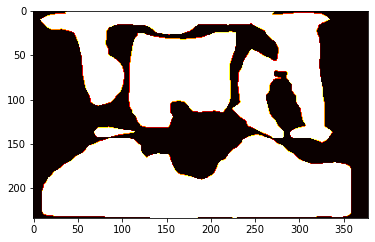

In [106]:
plt.imshow(conf_mask >= 0.4, cmap="hot")

In [107]:
img.shape, edges.shape, raw_seg.shape

((234, 378, 3), (234, 378), (234, 378))

In [109]:
np.unique(edges)

array([  0, 255], dtype=uint8)

04/27/2020 04:28:42 PM [DEBUG] im_floodfill: (234, 378)


No locations for label (1, 'ceiling')
No more confident locations for label (3, 'wall')
No more confident locations for label (4, 'windowpane, window')
No more confident locations for label (2, 'floor, flooring')


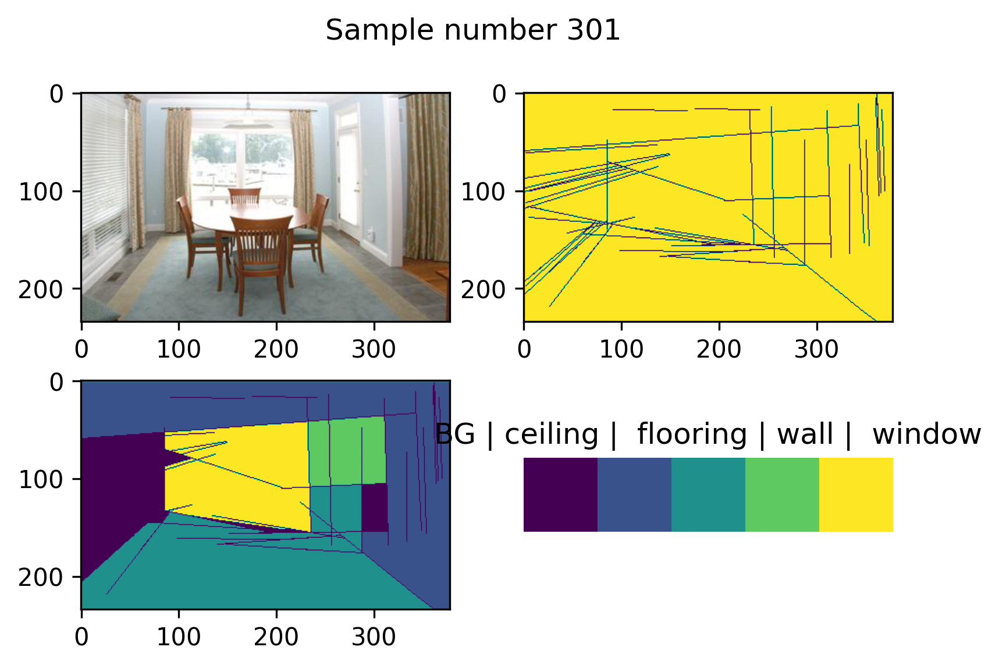

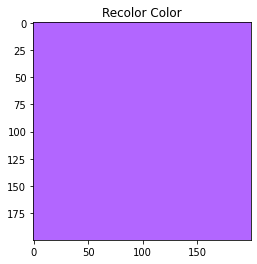

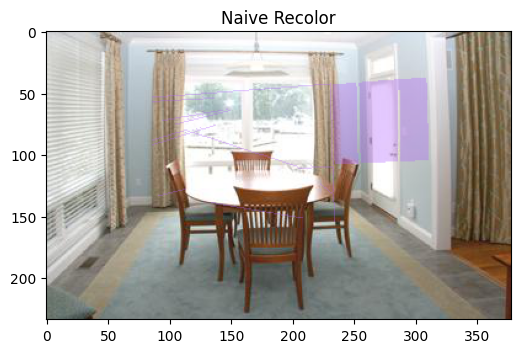

In [111]:
(img, edges_thresh, refined_seg) = process_sample(img, raw_seg, conf_mask,
                                                  threshold=0.70,
                                                  edges_thresh=edges)
disp_results(file_id, img, edges_thresh, refined_seg)
_ = recolor_naive(img, refined_seg, color_uint8)

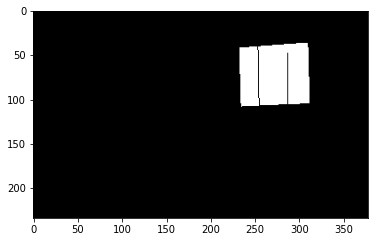

In [115]:
plt.imshow(refined_seg==WALL_ID, cmap="gray")

In [123]:
# color_uint8 = np.array([0, 100, 0]).astype(np.uint8)
# recolor_naive(img_scaled, img, gt_mask, pred_mask, color_uint8)
# recolor_using_hsv(img_scaled, img, gt_mask, pred_mask, color_uint8, alpha=0.5, beta=0.15)
# recolor_using_hsv(img_scaled, img, gt_mask, pred_mask, color_uint8, alpha=0.6, beta=0.15)
# recolor_using_hsv(img_scaled, img, gt_mask, pred_mask, color_uint8, alpha=0.6, beta=0.25)

In [124]:
keep_im_floodfill = None

In [143]:
(real_img, pred_mask, conf_mask) = use_model(file_id=117)

04/21/2020 08:25:47 PM [DEBUG] Using image val2014/117.jpg
04/21/2020 08:25:51 PM [DEBUG] There are 6 detections for image 117.jpg


In [144]:
hed_edges = create_hed(real_img)
_, edges_thresh = cv2.threshold(hed_edges, 70, 255, cv2.THRESH_BINARY_INV)
h, w, _ = edges_thresh.shape

edges_thresh = edges_thresh[:, :, 0]
im_floodfill = edges_thresh.copy() 

In [145]:
hed_edges.shape

(1720, 2580, 3)

In [146]:
edges_thresh.shape

(1720, 2580)

In [147]:
im_floodfill.shape

(1720, 2580)

In [148]:
np.unique(im_floodfill)

array([  0, 255], dtype=uint8)

In [149]:
pred_mask.shape

(1720, 2580)

In [36]:
image_ids = dataset_val.image_ids
# file_ids = np.random.choice(image_ids, 15)
# file_ids = [117, 5, 10, 20, 30]
file_ids = [301]

for file_id in file_ids:
    (img, pred_mask, conf_mask) = use_model(file_id=file_id)
    break
    (img, edges_thresh, refined_seg) = process_sample(img, pred_mask, conf_mask,
                                                    threshold=0.70)
#     disp_results(file_id, img, edges_thresh, refined_seg)
#     _ = recolor_naive(img, refined_seg, color_uint8)

04/27/2020 03:13:21 PM [DEBUG] Using image val2014/301.jpg
04/27/2020 03:13:25 PM [DEBUG] There are 4 detections for image 301.jpg


In [37]:
img.shape, pred_mask.shape, conf_mask.shape

((234, 378, 3), (234, 378), (234, 378))

In [38]:
(img, edges_thresh, refined_seg) = process_sample(img, pred_mask, conf_mask,
                                                    threshold=0.70)

In [133]:
np.unique(pred_mask)

array([0, 1, 2, 3, 4])

04/21/2020 09:13:46 PM [DEBUG] Using image val2014/20.jpg
04/21/2020 09:13:50 PM [DEBUG] There are 6 detections for image 20.jpg


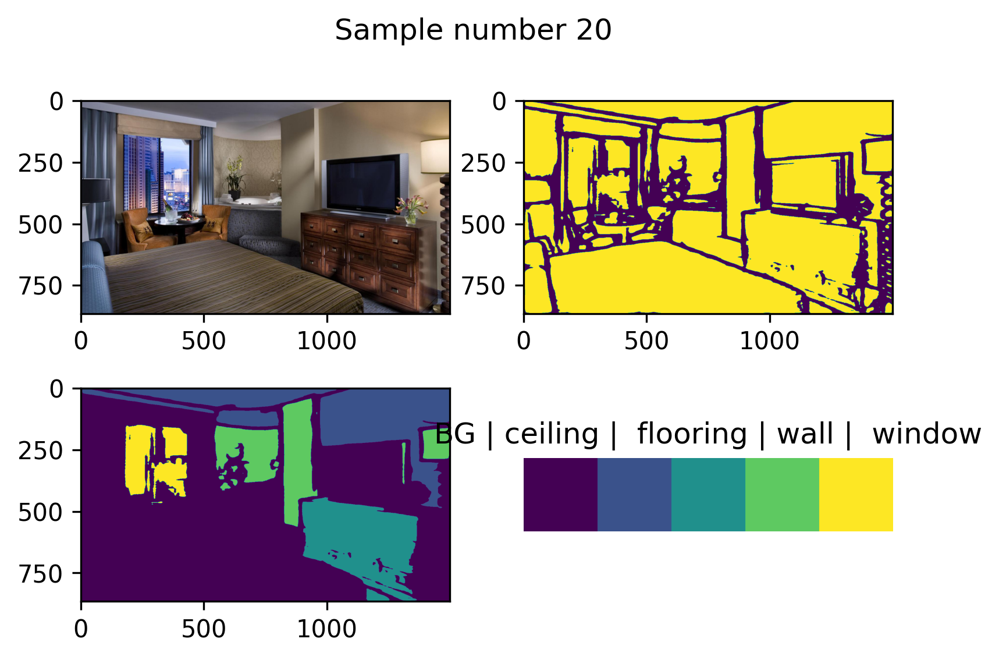

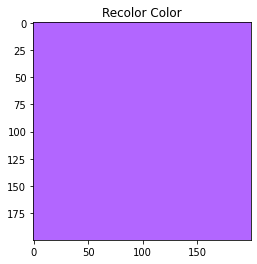

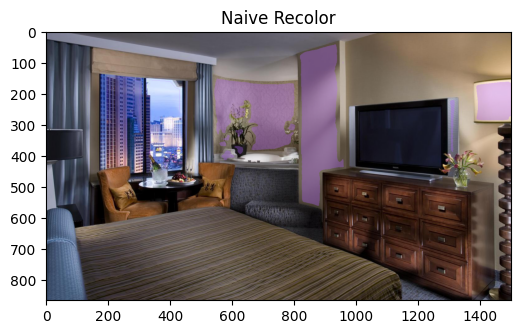

In [183]:
image_ids = dataset_val.image_ids
file_ids = np.random.choice(image_ids, 15)
file_ids = [117, 5, 10, 20, 30]
file_ids = [20]

for file_id in file_ids:
    (img, pred_mask, conf_mask) = use_model(file_id=file_id)
    (img, edges_thresh, refined_seg) = process_sample(img, pred_mask, conf_mask,
                                                    threshold=0.70)
    disp_results(file_id, img, edges_thresh, refined_seg)
    _ = recolor_naive(img, refined_seg, color_uint8)

In [191]:
file_ids

array([174, 430, 301])

04/22/2020 04:15:45 PM [DEBUG] Using image val2014/174.jpg
04/22/2020 04:15:49 PM [DEBUG] There are 4 detections for image 174.jpg
04/22/2020 04:15:59 PM [DEBUG] Time elapsed for 174.jpg: 9.6 seconds


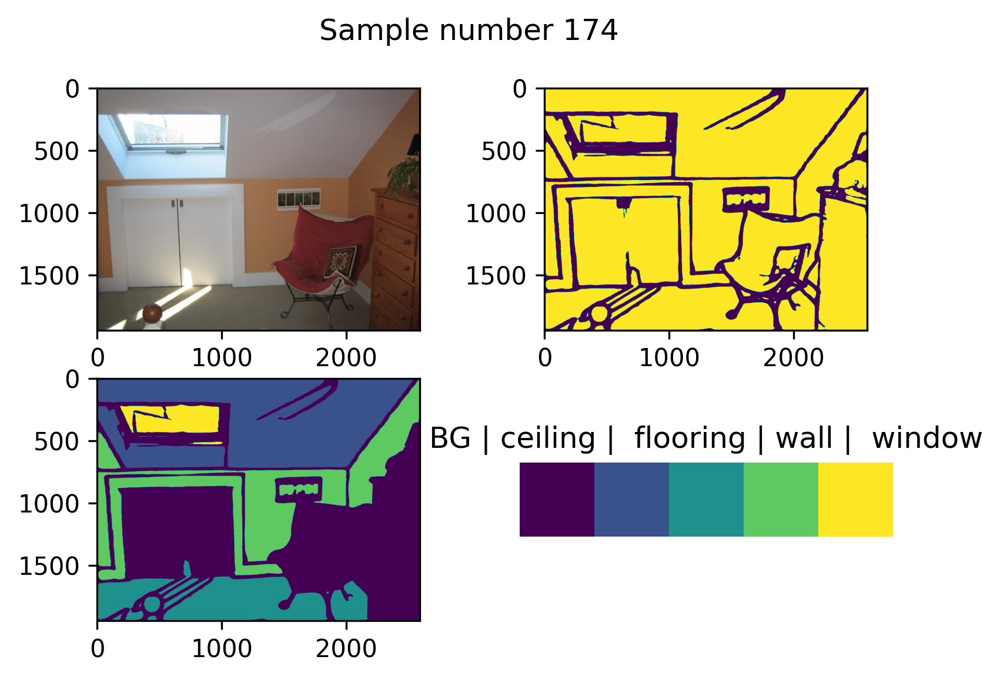

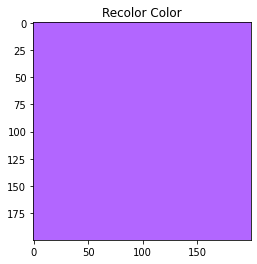

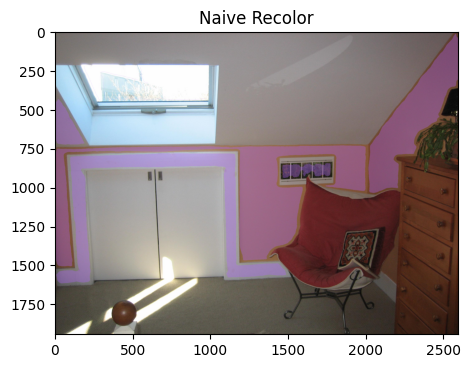

In [211]:
# image_ids = dataset_val.image_ids
# file_ids = np.random.choice(image_ids, 3)
file_ids = [174]

for file_id in file_ids:
    (img, pred_mask, conf_mask) = use_model(file_id=file_id)
    
    start_time = time.time()
    (img, edges_thresh, refined_seg) = process_sample(img, pred_mask, conf_mask,
                                                    threshold=0.70)

    end_time = time.time()
    elapsed_time = end_time - start_time
    debug("Time elapsed for {:03d}.jpg: {:.1f} seconds".format(file_id, 
                                                              elapsed_time))
    
    disp_results(file_id, img, edges_thresh, refined_seg)
    recolored_img = recolor_naive(img, refined_seg, color_uint8)

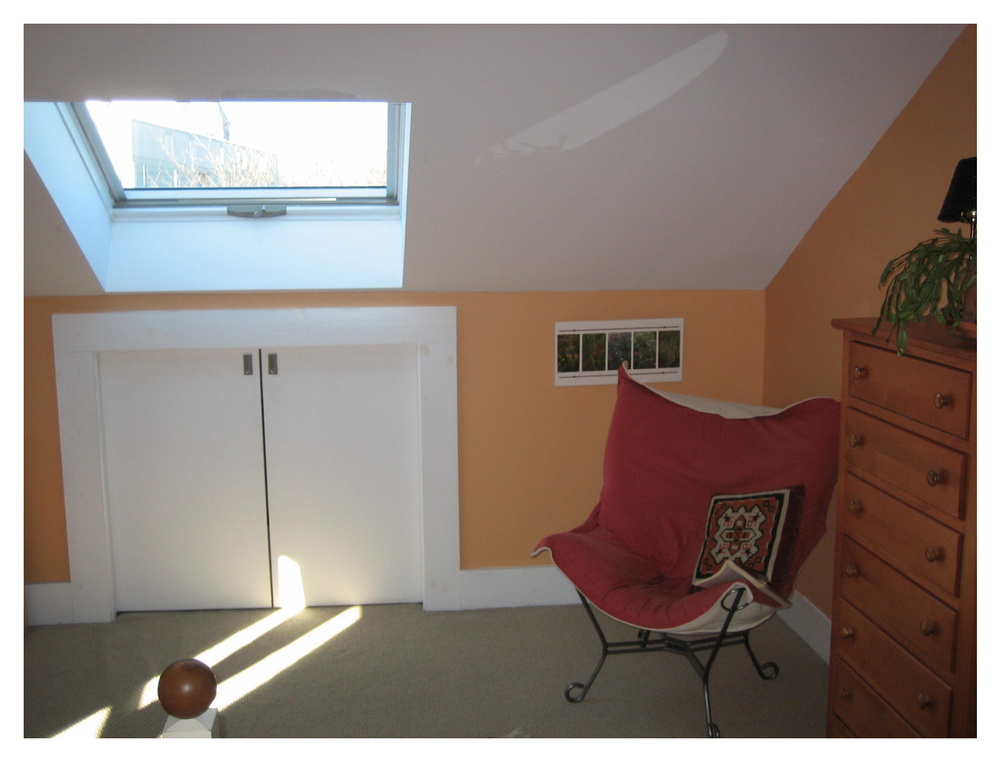

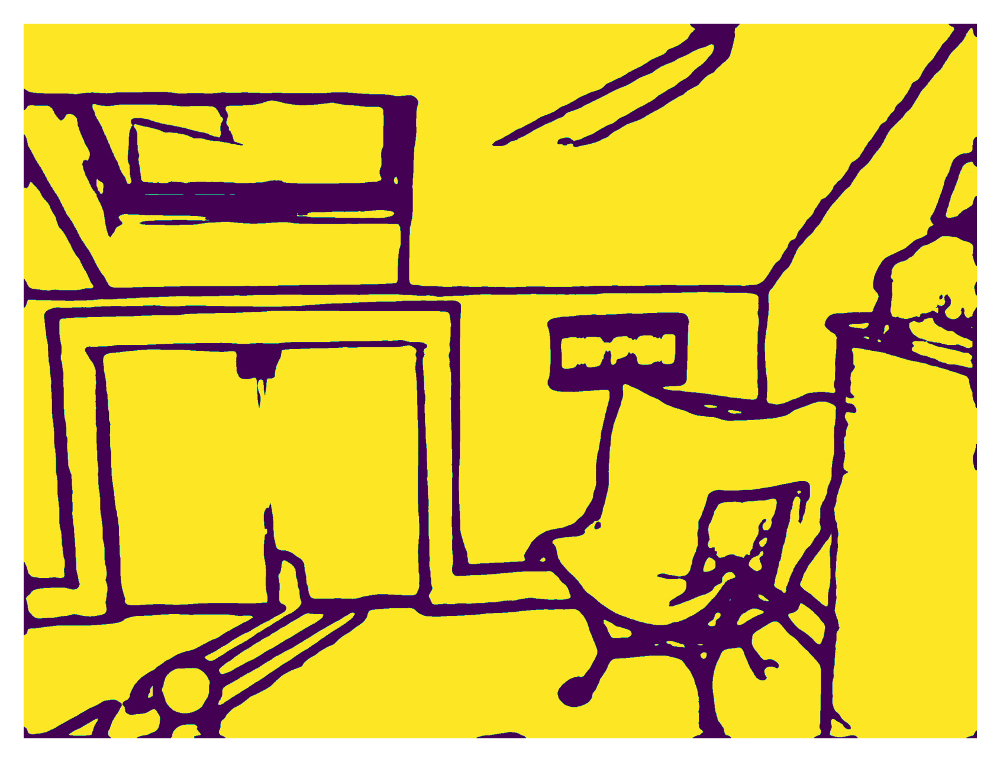

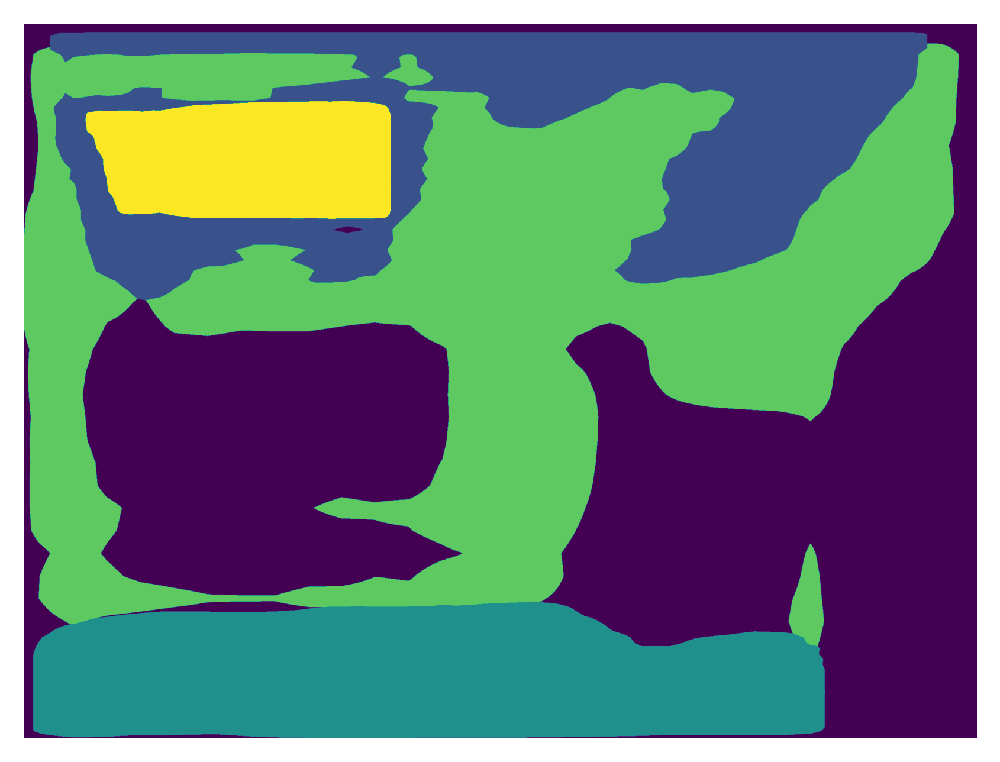

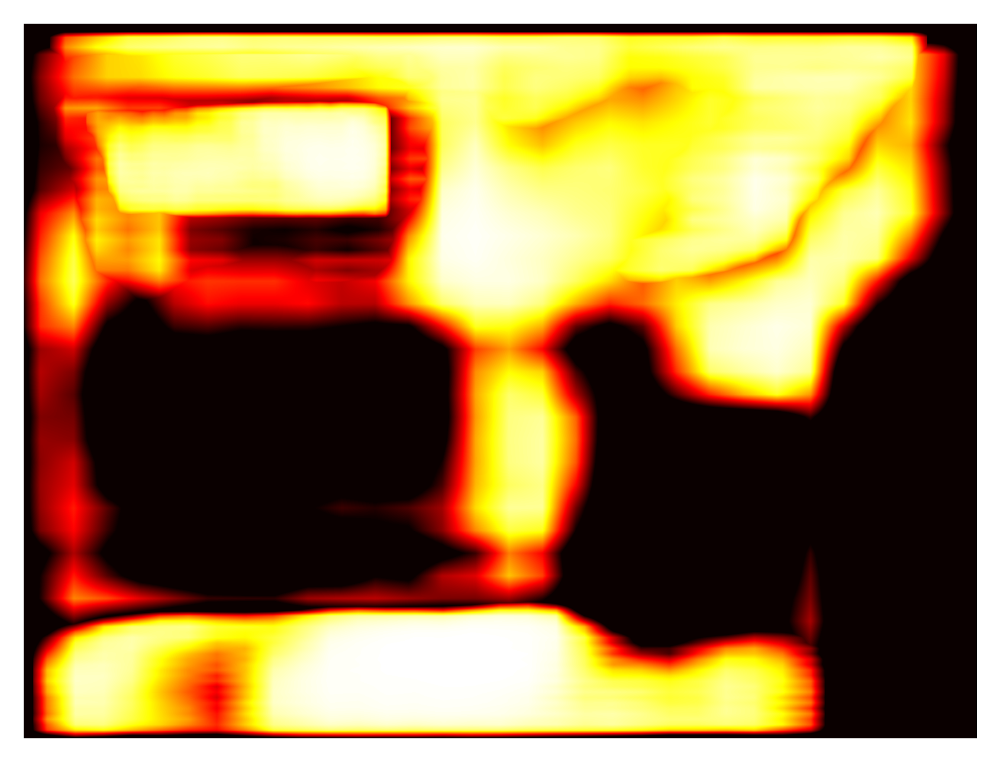

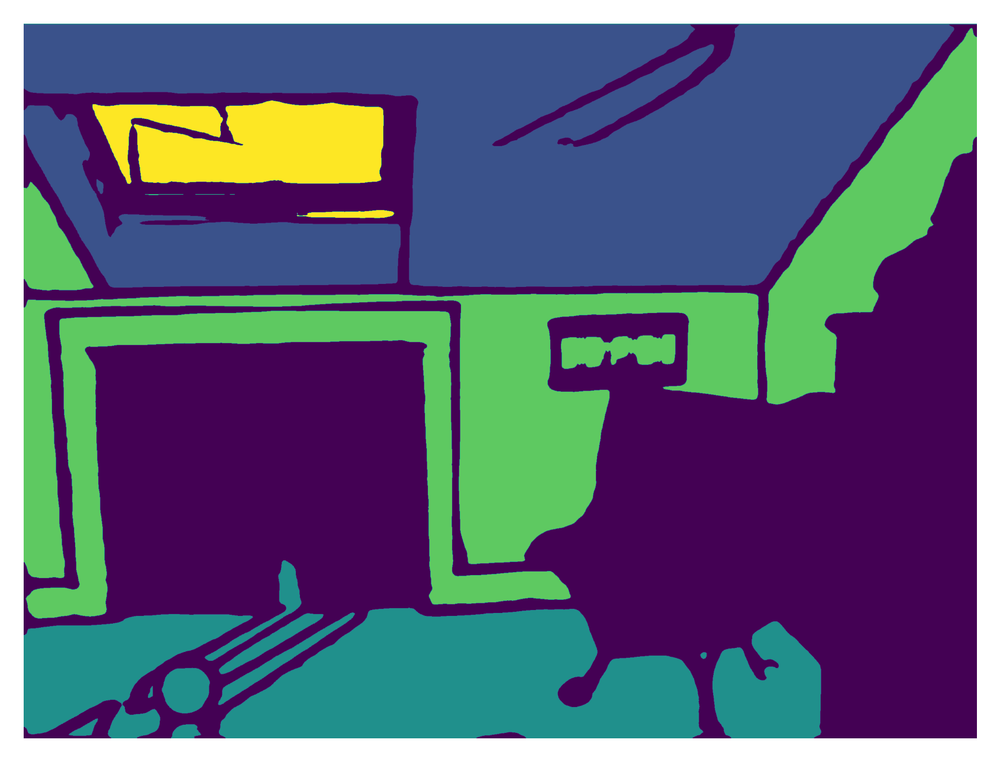

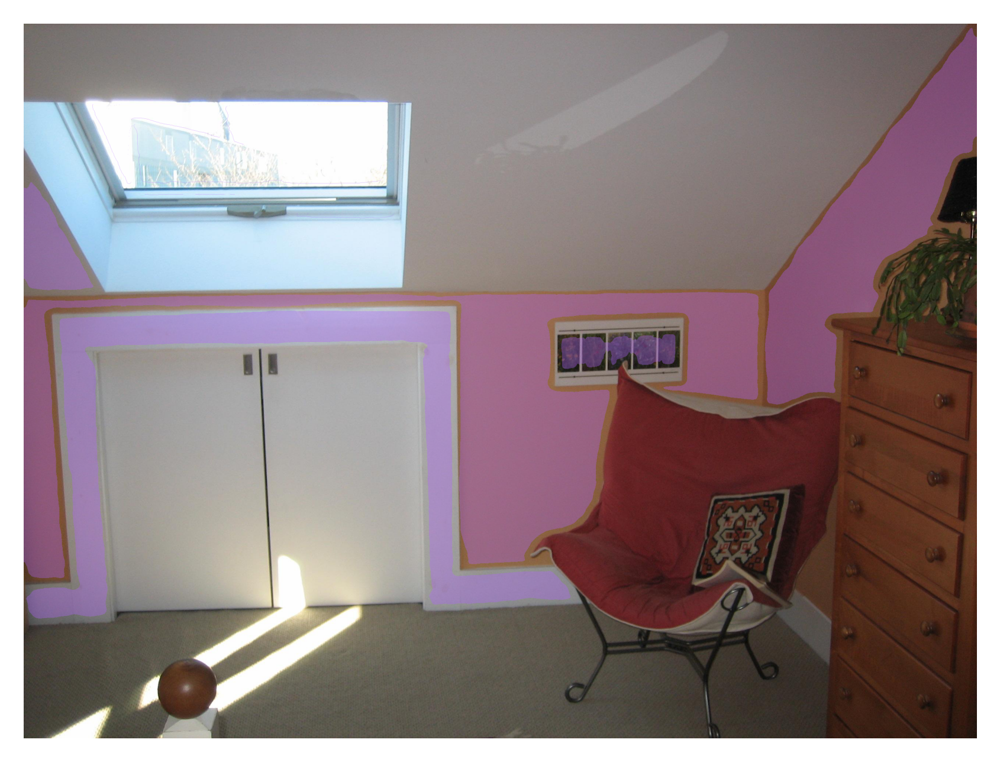

In [215]:
fig = plt.figure(dpi=400); plt.axis("off"); plt.imshow(img); fig.savefig("tmp/image.png")
fig = plt.figure(dpi=400); plt.axis("off"); plt.imshow(edges_thresh); fig.savefig("tmp/edges_thresh.png")
fig = plt.figure(dpi=400); plt.axis("off"); plt.imshow(pred_mask); fig.savefig("tmp/raw_seg.png")
fig = plt.figure(dpi=400); plt.axis("off"); plt.imshow(conf_mask, cmap="hot"); fig.savefig("tmp/seg_confidence.png")
fig = plt.figure(dpi=400); plt.axis("off"); plt.imshow(refined_seg); fig.savefig("tmp/refined_seg.png")
fig = plt.figure(dpi=400); plt.axis("off"); plt.imshow(recolored_img); fig.savefig("tmp/recolored.png")

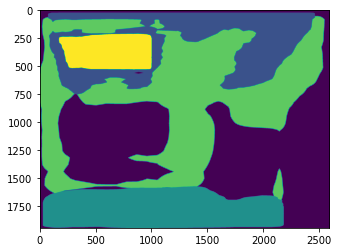

In [193]:
plt.imshow(pred_mask)

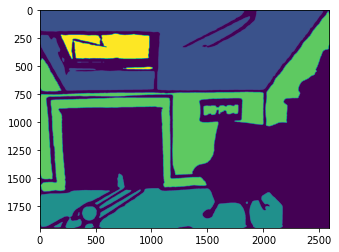

In [194]:
plt.imshow(refined_seg)

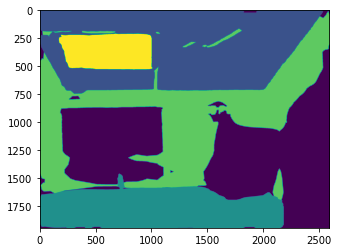

In [195]:
improved_seg = refined_seg.copy()
bg_mask = (refined_seg == 0)
improved_seg[bg_mask] = pred_mask[bg_mask]
plt.imshow(improved_seg)

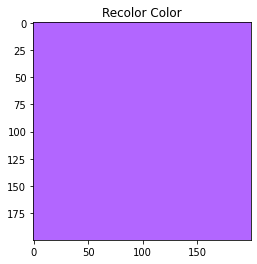

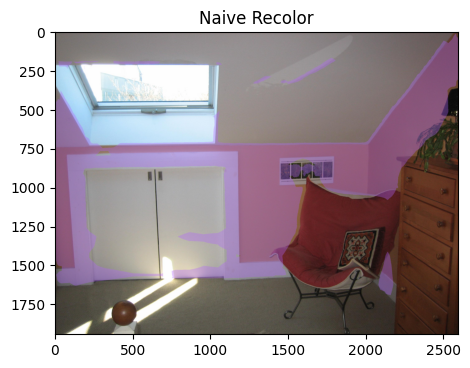

In [196]:
recolor_naive(img, improved_seg, color_uint8)

04/22/2020 02:33:53 PM [DEBUG] Using image val2014/174.jpg
04/22/2020 02:33:57 PM [DEBUG] There are 4 detections for image 174.jpg
04/22/2020 02:34:08 PM [DEBUG] Using image val2014/430.jpg
04/22/2020 02:34:12 PM [DEBUG] There are 4 detections for image 430.jpg
04/22/2020 02:34:17 PM [DEBUG] Using image val2014/301.jpg
04/22/2020 02:34:20 PM [DEBUG] There are 4 detections for image 301.jpg


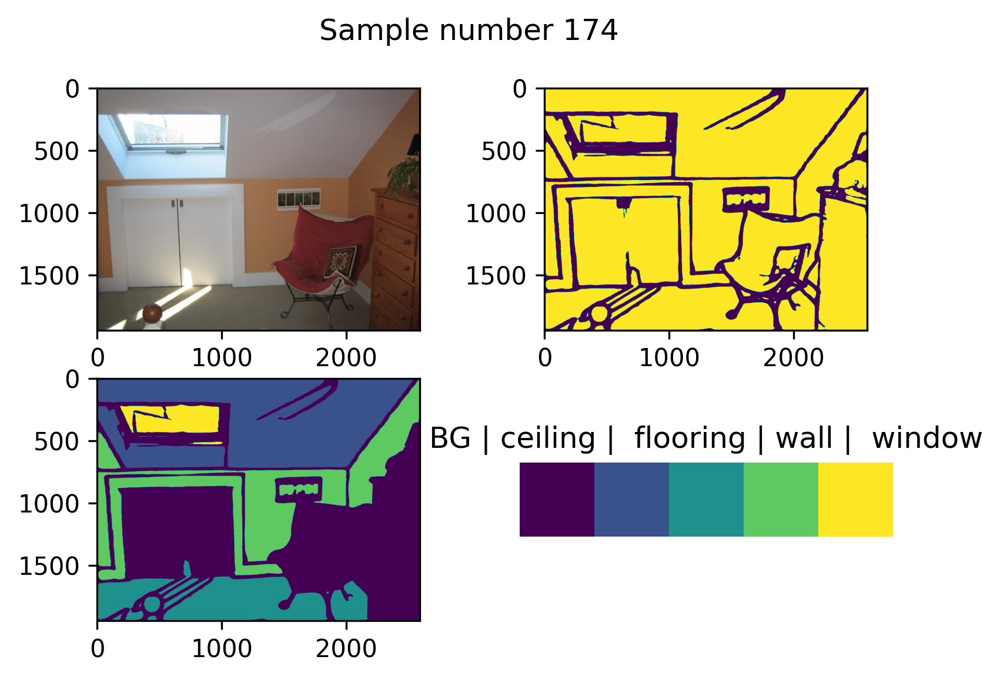

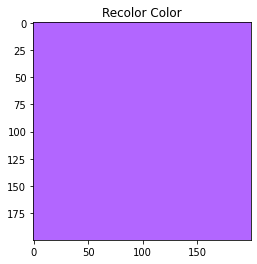

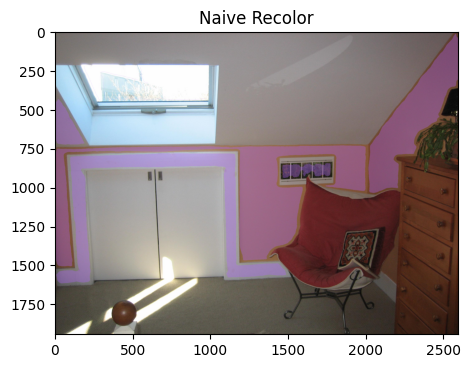

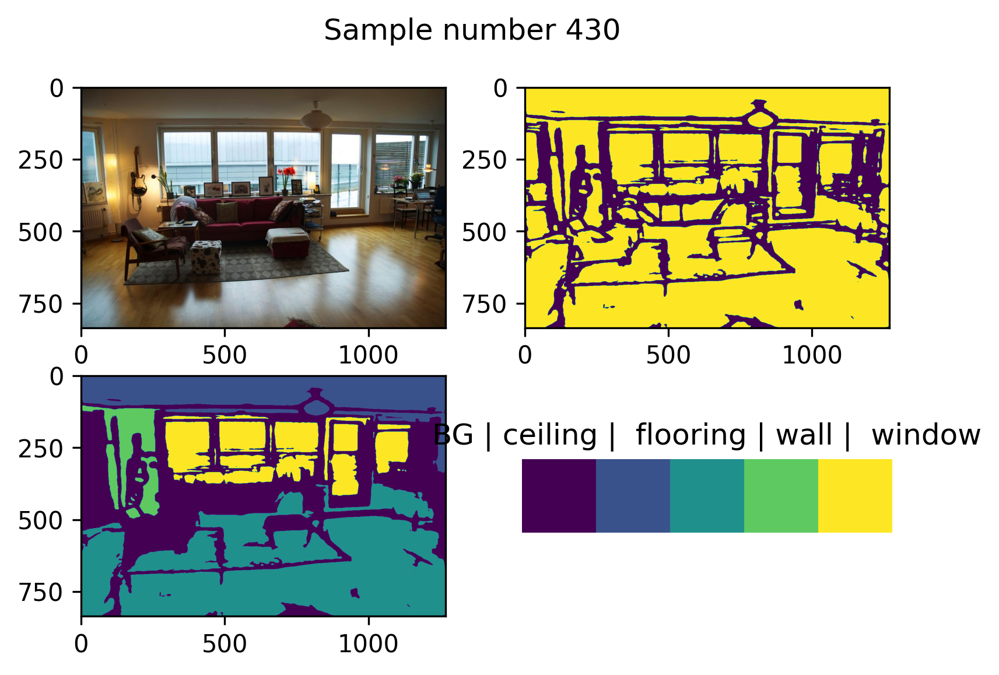

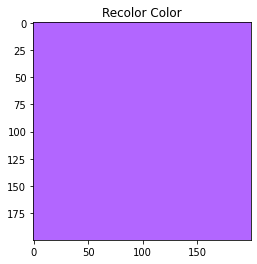

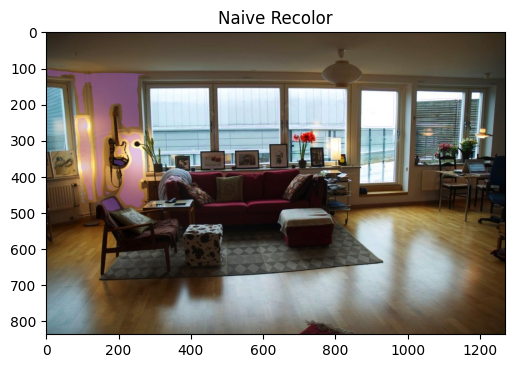

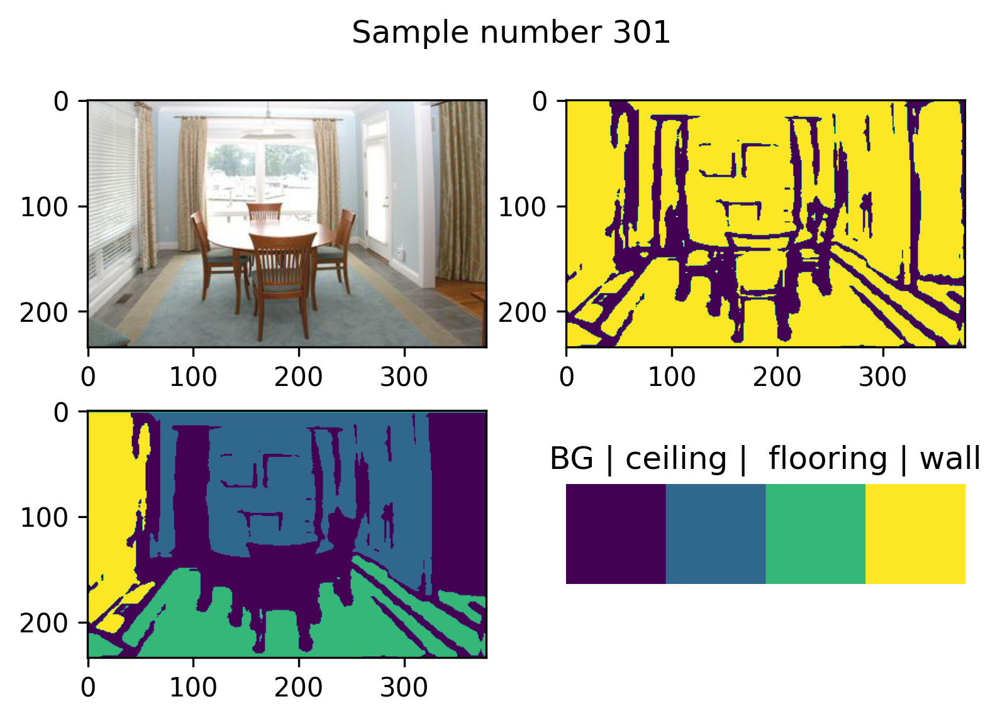

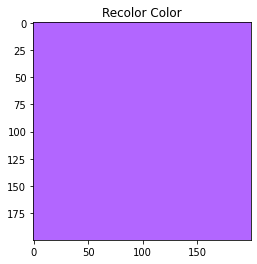

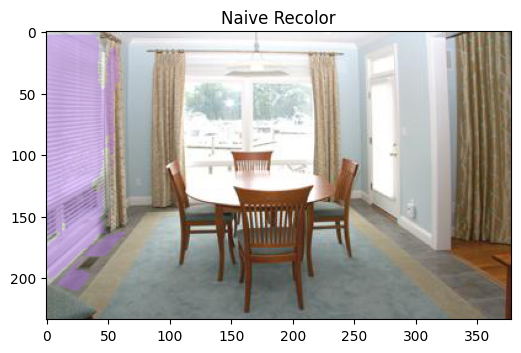

In [197]:
file_ids = np.array([174, 430, 301])


for file_id in file_ids:
    (img, pred_mask, conf_mask) = use_model(file_id=file_id)
    (img, edges_thresh, refined_seg) = process_sample(img, pred_mask, conf_mask,
                                                    threshold=0.70)
    disp_results(file_id, img, edges_thresh, refined_seg)
    recolor_naive(img, refined_seg, color_uint8)

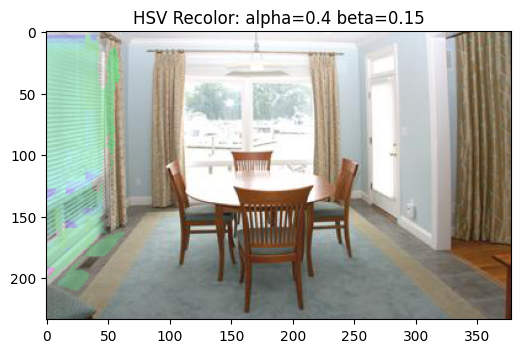

In [206]:
recolor_using_hsv(img, refined_seg, color_uint8)

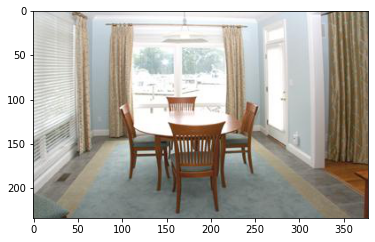

In [198]:
plt.imshow(img)

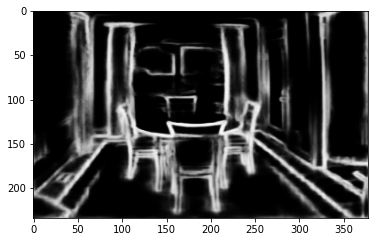

In [199]:
hed_edges = create_hed(img)
_, edges_thresh = cv2.threshold(hed_edges, 70, 255, cv2.THRESH_BINARY_INV)

plt.imshow(hed_edges)

In [200]:
np.unique(hed_edges)

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 18

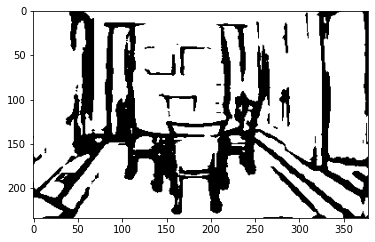

In [201]:
_, edges_thresh = cv2.threshold(hed_edges, 70, 255, cv2.THRESH_BINARY_INV)
plt.imshow(edges_thresh)

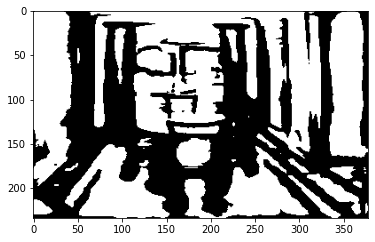

In [203]:
_, edges_thresh = cv2.threshold(hed_edges, 10, 255, cv2.THRESH_BINARY_INV)
plt.imshow(edges_thresh)

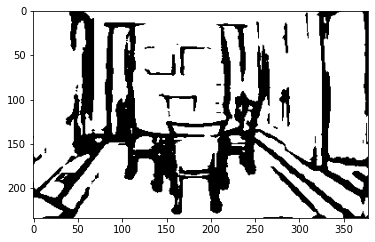

In [205]:
_, edges_thresh = cv2.threshold(hed_edges, 70, 255, cv2.THRESH_BINARY_INV)
plt.imshow(edges_thresh)

04/22/2020 08:23:27 PM [DEBUG] Using image val2014/301.jpg
04/22/2020 08:23:31 PM [DEBUG] There are 4 detections for image 301.jpg
04/22/2020 08:23:33 PM [DEBUG] Time elapsed for 301.jpg: 1.5 seconds


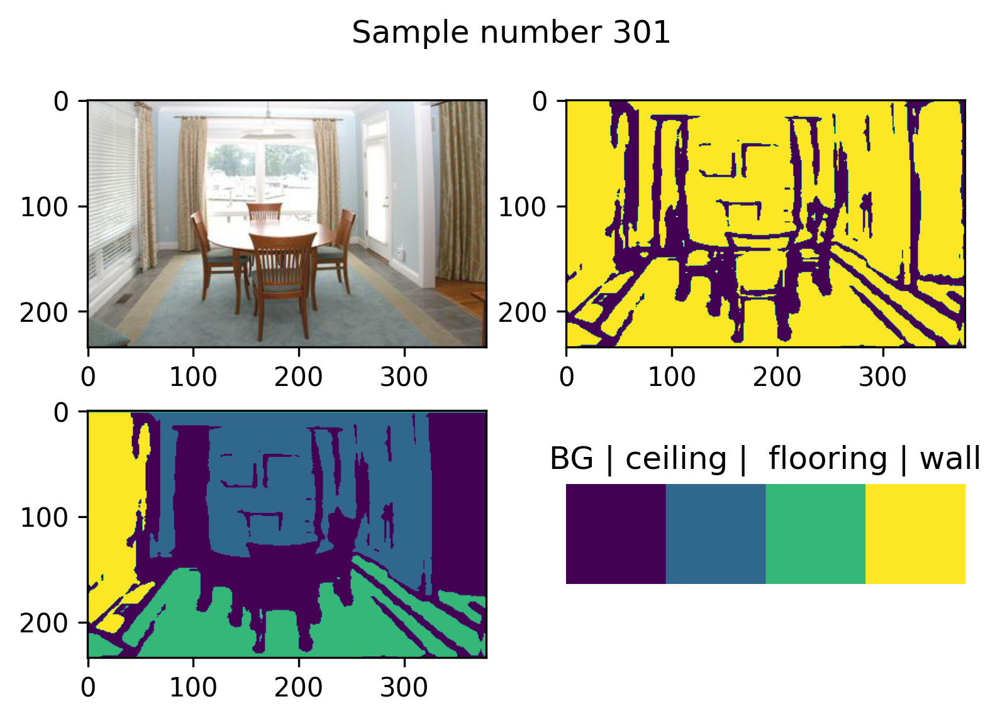

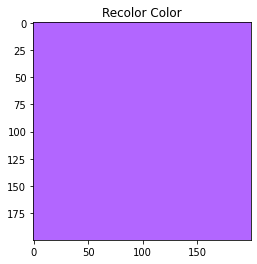

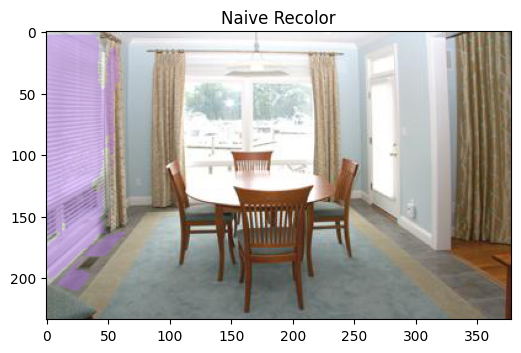

In [221]:
# image_ids = dataset_val.image_ids
# file_ids = np.random.choice(image_ids, 3)
file_ids = [301]

for file_id in file_ids:
    (img, pred_mask, conf_mask) = use_model(file_id=file_id)
    
    start_time = time.time()
    (img, edges_thresh, refined_seg) = process_sample(img, pred_mask, conf_mask,
                                                    threshold=0.70)

    end_time = time.time()
    elapsed_time = end_time - start_time
    debug("Time elapsed for {:03d}.jpg: {:.1f} seconds".format(file_id, 
                                                              elapsed_time))
    
    disp_results(file_id, img, edges_thresh, refined_seg)
    recolored_img = recolor_naive(img, refined_seg, color_uint8)

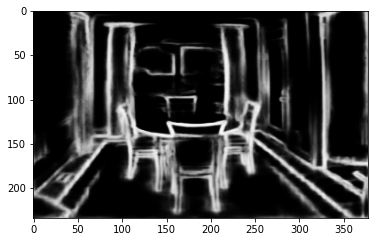

In [222]:
hed_edges = create_hed(img)
plt.imshow(hed_edges)

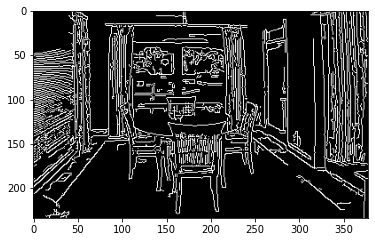

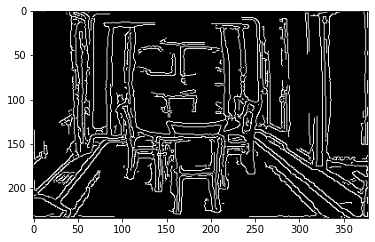

In [294]:
canny_edges = cv2.Canny(img, 50, 150)
plt.figure(); plt.imshow(canny_edges, cmap="gray")

hed_canny_edges = cv2.Canny(hed_edges, 50, 150)
plt.figure(); plt.imshow(hed_canny_edges, cmap="gray")

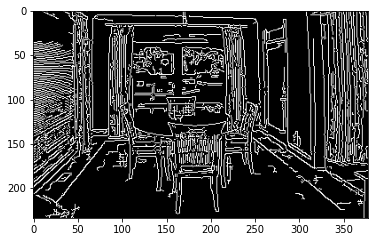

In [293]:
canny_edges = cv2.Canny(img, 50, 120)
plt.figure(); plt.imshow(canny_edges, cmap="gray")

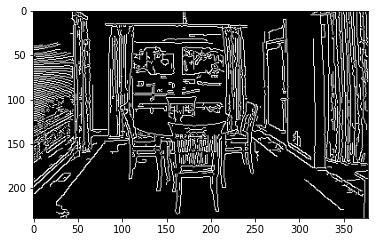

In [292]:
canny_edges = cv2.Canny(img, 50, 120, apertureSize=3, L2gradient=True)
plt.figure(); plt.imshow(canny_edges, cmap="gray")

04/22/2020 08:45:18 PM [DEBUG] Using image val2014/117.jpg
04/22/2020 08:45:21 PM [DEBUG] There are 6 detections for image 117.jpg


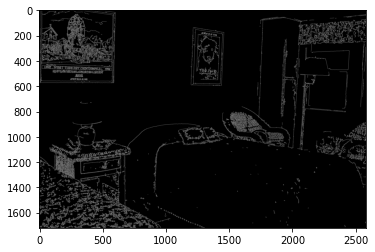

In [295]:
good_img, _, _ = use_model(117)
canny_edges = cv2.Canny(good_img, 50, 120)
plt.figure(); plt.imshow(canny_edges, cmap="gray")

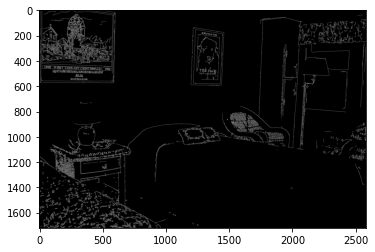

In [296]:
canny_edges = cv2.Canny(good_img, 50, 120, apertureSize=3, L2gradient=True)
plt.figure(); plt.imshow(canny_edges, cmap="gray")